In [1]:
import tensorflow as tf

gpus = tf.config.list_physical_devices('GPU')
gpu = gpus[0]

tf.config.experimental.set_memory_growth(gpu, True)

In [2]:
tf.compat.v1.disable_eager_execution()

In [3]:
from keras.applications import VGG16
from keras import backend as K

In [4]:
model = VGG16(weights='imagenet', include_top=False)

In [5]:
model.summary(0)

Model: "vgg16"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, None, None, 3)]   0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, None, None, 64)    1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, None, None, 64)    36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, None, None, 64)    0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, None, None, 128)   73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, None, None, 128)   147584    
_________________________________________________________________
block2_pool (MaxPooling2D)   (None, None, None, 128)   0     

In [58]:
layer_name = 'block1_conv1'

filter_index = 0
layer_op = model.get_layer(layer_name).output
loss = K.mean(layer_op[:,:,:,0])

# <KerasTensor: shape=() dtype=float32 (created by layer 'tf.math.reduce_mean')>
grads = K.gradients(loss, model.input)[0]
grads
# use gradientTape when using eager execution and not gradients

<tf.Tensor 'gradients_5/block1_conv1/Conv2D_grad/Conv2DBackpropInput:0' shape=(None, None, None, 3) dtype=float32>

In [6]:
import numpy as np
import matplotlib.pyplot as plt

In [7]:
input_img_data = np.random.random((1,150,150,3))*20 + 128.

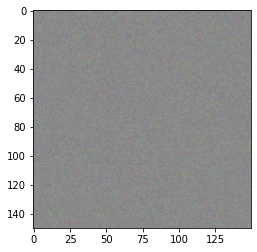

In [8]:
plt.imshow(input_img_data[0].astype('uint8'))
plt.show()

In [9]:
def deprocess_image(x):
    x -= x.mean()
    x /= (x.std() + 1e-5)
    x *= 0.1
    
    x += 0.5
    x = np.clip(x, 0, 1)
    
    x *= 255
    x = np.clip(x, 0, 255).astype('uint8')
    
    return x

In [21]:
from tqdm import tqdm

In [25]:
def generate_pattern(layer_name, filter_index, size=150):
#     K.clear_session()
    layer_output = model.get_layer(layer_name).output
#     print(layer_name)
    loss=0
    grads=0
    
    loss = K.mean(layer_output[:,:,:,filter_index])
    grads = K.gradients(loss, model.input)[0]
    grads /= (K.sqrt(K.mean(K.square(grads)))+1e-5)
    iterate = K.function([model.input], [loss, grads])
    
    input_img_data = np.random.random((1,size,size,3))*20 + 128.    
    
    step = 1
    for i in range(40):
        loss_value, grads_value = iterate([input_img_data])
        input_img_data += grads_value * step
    
    img = input_img_data[0]
    return deprocess_image(img)

100%|██████████| 40/40 [00:00<00:00, 71.60it/s]


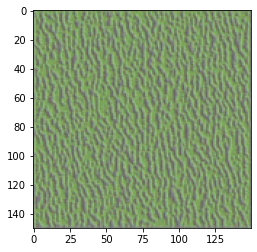

100%|██████████| 40/40 [00:00<00:00, 43.98it/s]


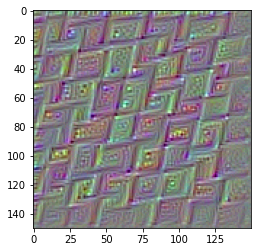

In [23]:
size = 150
plt.imshow(generate_pattern('block1_conv1', 44, size=size))
plt.show()
plt.imshow(generate_pattern('block4_conv1', 44, size=size))
plt.show()


100%|██████████| 8/8 [00:49<00:00,  6.25s/it]


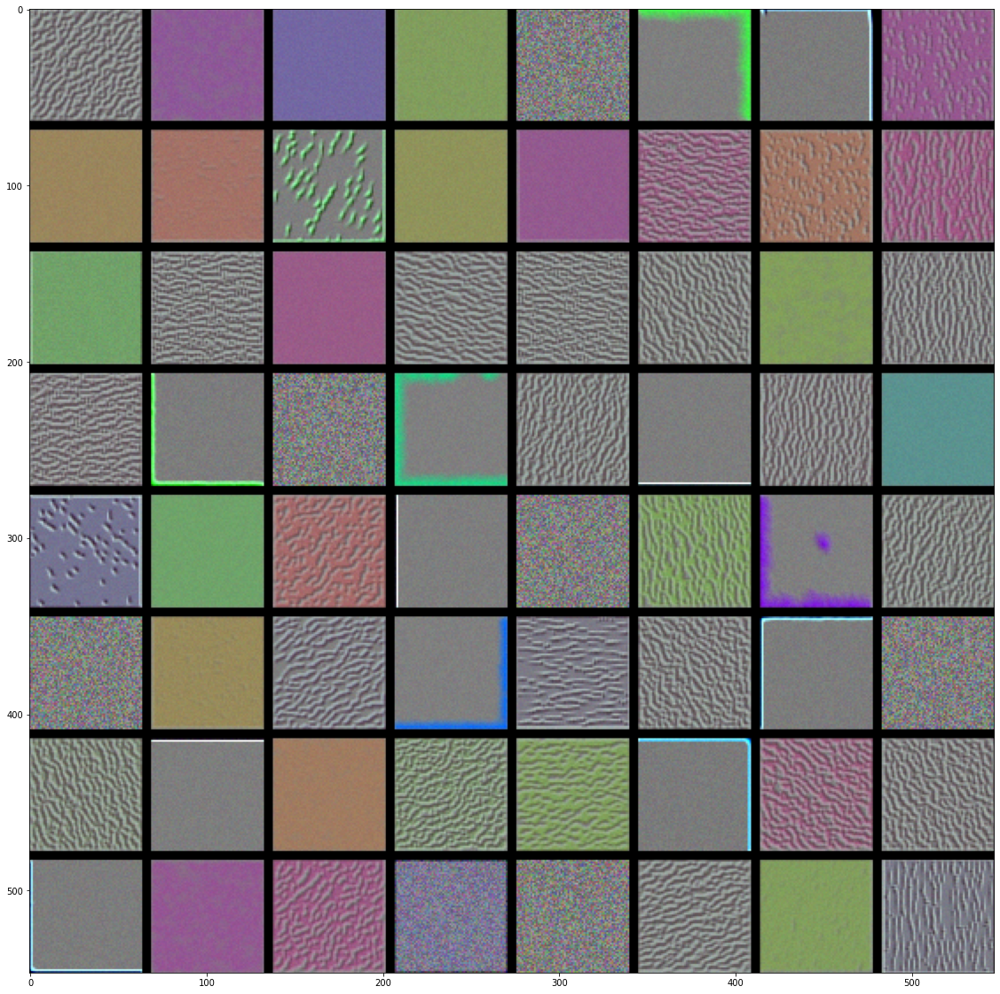

In [26]:
layer_name = 'block1_conv1'
size = 64
margin = 5

results = np.zeros((8*size+7*margin,8*size+7*margin,3))

for i in tqdm(range(8)):
    for j in range(8):
        filter_img = generate_pattern(layer_name, i+(j*8), size=size)
        
        horz_start = i*size + i*margin
        horz_end = horz_start + size
        
        vert_start = j*size + j*margin
        vert_end = vert_start + size
        
        results[horz_start:horz_end,
                vert_start:vert_end, :] = filter_img

plt.figure(figsize=(20,20))
plt.imshow(results.astype('uint8'))
plt.savefig(f'{layer_name}.jpg')

100%|██████████| 8/8 [00:59<00:00,  7.48s/it]


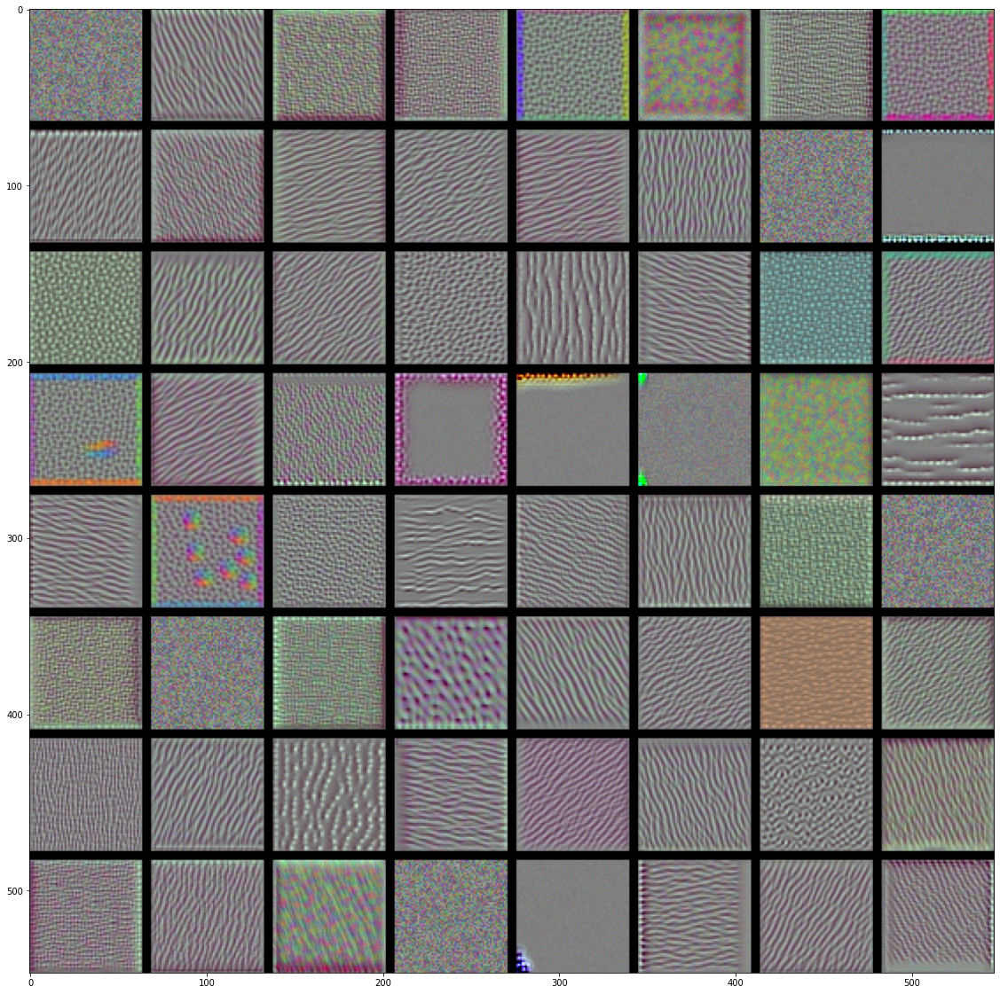

In [27]:
layer_name = 'block2_conv1'
size = 64
margin = 5

results = np.zeros((8*size+7*margin,8*size+7*margin,3))

for i in tqdm(range(8)):
    for j in range(8):
        filter_img = generate_pattern(layer_name, i+(j*8), size=size)
        
        horz_start = i*size + i*margin
        horz_end = horz_start + size
        
        vert_start = j*size + j*margin
        vert_end = vert_start + size
        
        results[horz_start:horz_end,
                vert_start:vert_end, :] = filter_img

plt.figure(figsize=(20,20))
plt.imshow(results.astype('uint8'))
plt.savefig(f'{layer_name}.jpg')

100%|██████████| 8/8 [01:14<00:00,  9.29s/it]


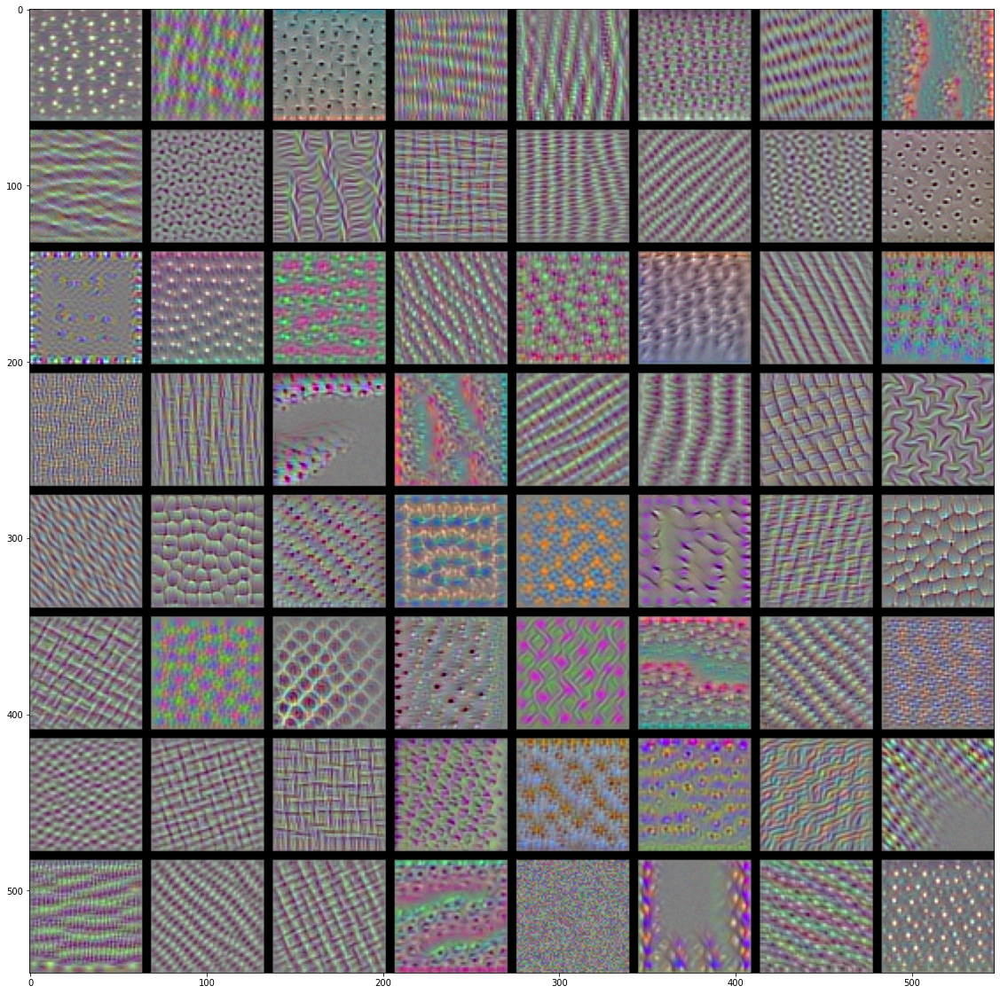

In [28]:
layer_name = 'block3_conv1'
size = 64
margin = 5

results = np.zeros((8*size+7*margin,8*size+7*margin,3))

for i in tqdm(range(8)):
    for j in range(8):
        filter_img = generate_pattern(layer_name, i+(j*8), size=size)
        
        horz_start = i*size + i*margin
        horz_end = horz_start + size
        
        vert_start = j*size + j*margin
        vert_end = vert_start + size
        
        results[horz_start:horz_end,
                vert_start:vert_end, :] = filter_img

plt.figure(figsize=(20,20))
plt.imshow(results.astype('uint8'))
plt.savefig(f'{layer_name}.jpg')

100%|██████████| 8/8 [01:26<00:00, 10.78s/it]


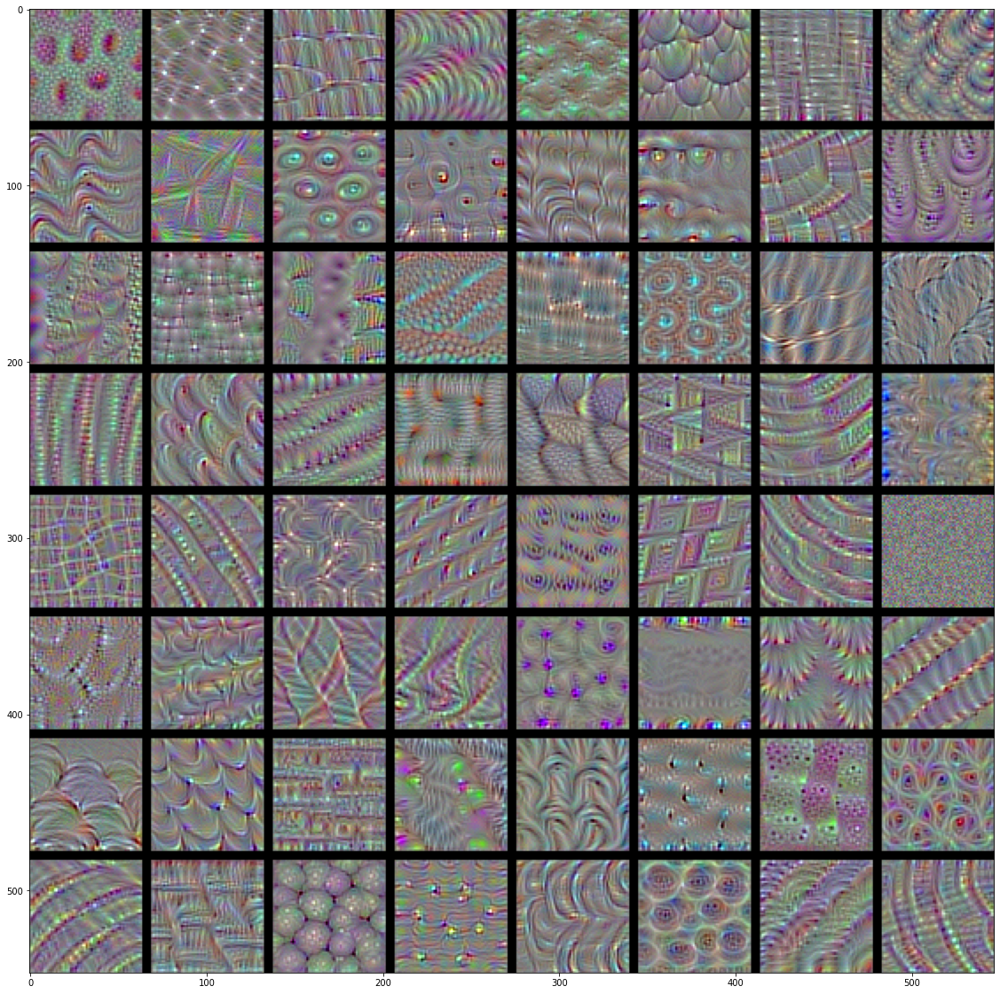

In [29]:
layer_name = 'block4_conv1'
size = 64
margin = 5

results = np.zeros((8*size+7*margin,8*size+7*margin,3))

for i in tqdm(range(8)):
    for j in range(8):
        filter_img = generate_pattern(layer_name, i+(j*8), size=size)
        
        horz_start = i*size + i*margin
        horz_end = horz_start + size
        
        vert_start = j*size + j*margin
        vert_end = vert_start + size
        
        results[horz_start:horz_end,
                vert_start:vert_end, :] = filter_img

plt.figure(figsize=(20,20))
plt.imshow(results.astype('uint8'))
plt.savefig(f'{layer_name}.jpg')

100%|██████████| 8/8 [01:46<00:00, 13.26s/it]


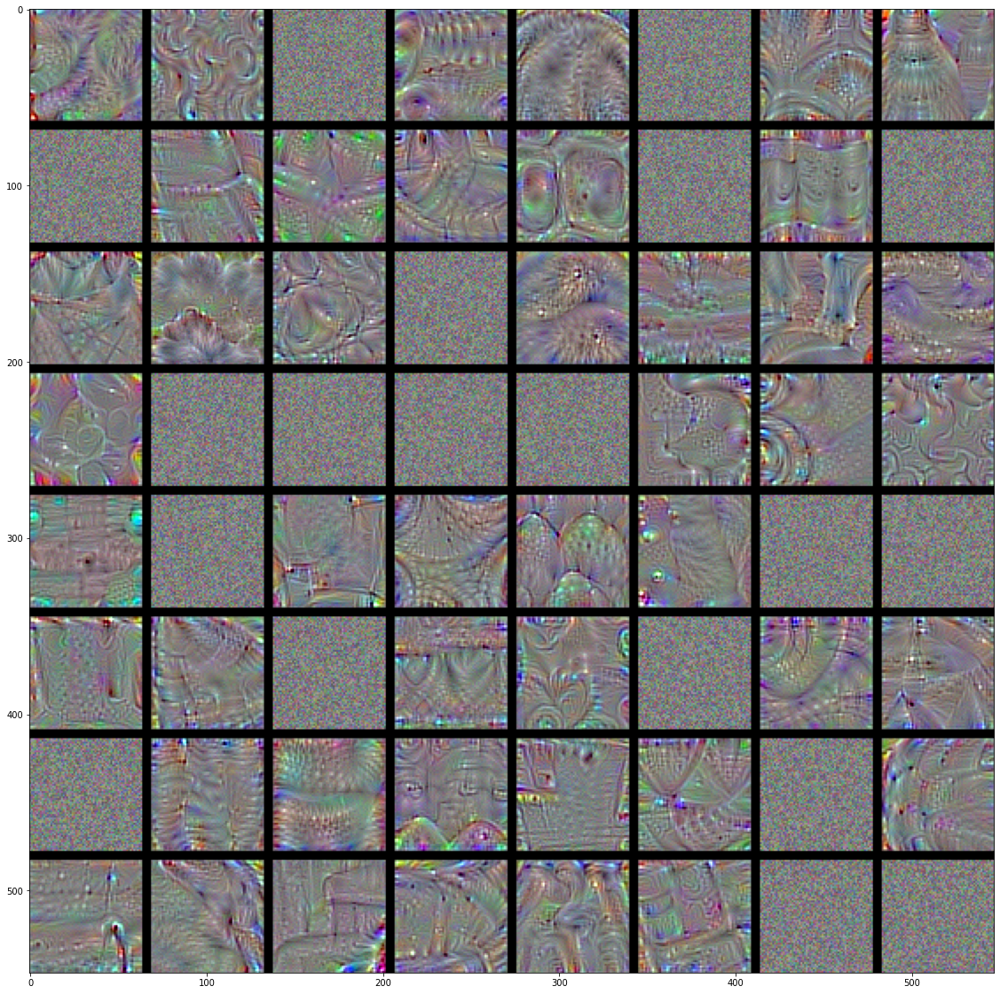

In [30]:
layer_name = 'block5_conv1'
size = 64
margin = 5

results = np.zeros((8*size+7*margin,8*size+7*margin,3))

for i in tqdm(range(8)):
    for j in range(8):
        filter_img = generate_pattern(layer_name, i+(j*8), size=size)
        
        horz_start = i*size + i*margin
        horz_end = horz_start + size
        
        vert_start = j*size + j*margin
        vert_end = vert_start + size
        
        results[horz_start:horz_end,
                vert_start:vert_end, :] = filter_img

plt.figure(figsize=(20,20))
plt.imshow(results.astype('uint8'))
plt.savefig(f'{layer_name}.jpg')